# Introduction

In this notebook we will be exploring parking tickets issued for infractions by the city of toronto from 2008 to 2020. The data is openly available in their data portal at https://open.toronto.ca/dataset/parking-tickets/. In this particular notebook we will be exploring and trying to interpret the data geographically. This notebook is the continuation of the notebook DataExploration.ipynb which includes aspatial data exploration. This notebook also makes use of further datasets available on the data portal
such as **Green P parking** (https://open.toronto.ca/dataset/green-p-parking/), **TTC Routes and Schedules** (https://open.toronto.ca/dataset/ttc-routes-and-schedules/) and **City Wards** (https://open.toronto.ca/dataset/city-wards/).

# Setting things up

First let's take care of imports and global variables that we will be using later

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import json
import folium
import matplotlib.pyplot as plt

from folium.plugins import LocateControl
from geopy.geocoders import Nominatim
from geopy.distance import geodesic

from shapely.ops import nearest_points

In [2]:
# path to folders containing data
folders = {
    "tickets":"data/tickets/csv",
    "green-p-parking":"data/greenp",
    "ttc":"data/ttc/data",
}
# geojson file containing wards
wards_gjson = "data/city_wards.geojson"
# file created from DataExploration.ipynb contained cleaned and combined tickets
combined_tickets = "data/tickets/combined.csv"

# Reading the tickets
Since we have combined and exported the CSV files in the previous notebook we can directly read from that file.

In [3]:
# read from the combined file containing all the tickets
all_tickets = pd.read_csv(combined_tickets).drop(columns='Unnamed: 0')
# get string columns and trim them
strings = all_tickets.select_dtypes(['object'])
all_tickets[strings.columns] = strings.apply(lambda x: x.str.strip())
# inspect a sample of the parsed dataset
all_tickets.head()

,tag_number_masked,date_of_infraction,infraction_code,infraction_description,set_fine_amount,time_of_infraction,location1,location2,location3,location4,province
0,***51471,20191124,207.0,PARK MACHINE-REQD FEE NOT PAID,30,2011.0,NR,548 DANFORTH AVE,NaN,NaN,ON
1,***61170,20191124,207.0,PARK MACHINE-REQD FEE NOT PAID,30,2011.0,NR,510 COLLEGE ST,NaN,NaN,ON
2,***92224,20191124,207.0,PARK MACHINE-REQD FEE NOT PAID,30,2011.0,NR,541 MOUNT PLEASANT RD,NaN,NaN,ON
3,***76780,20191124,29.0,PARK PROHIBITED TIME NO PERMIT,30,2012.0,E/S,PRINCESS ST,S/O,FRONT ST E,ON
4,***39600,20191124,2.0,PARK - LONGER THAN 3 HOURS,30,2012.0,NR,32 FIELDWOOD DR,NaN,NaN,ON


# Identifying hotspots
The first thing we do in this geographical analysis is identify locations that see more infractions compared to other locations. We can do that in two ways
- Observe the frequency of infractions
- Calculate the net revenue generated by fines

Here, we take 20 top locations to study. 

*DISCLAIMER: The dataset for tickets has two location fields **location2** and **location4**. However, the field **location4** contains a lot of null data since it is optional and is mostly used together with **location2**. While it would be better to combine these two information in some way to get a more accurate picture, due to limited time and knowledge on these fields, I have chosen to use **location2** for the address of an infraction.*

In [4]:
# get the number of ttimes a location repears in the ticket dataset
location2_counts = all_tickets['location2'].value_counts()
location2_counts

2075 BAYVIEW AVE         74074
20 EDWARD ST             68829
1750 FINCH AVE E         52808
JAMES ST                 38109
2075 BAYVIEW AV          36430
                         ...  
175 THISTLE DOWN BLVD        1
38 CAITHNESS AVE             1
30 TRUDELE ST                1
21 BENFRISCO CRESCENT        1
787 DON MILLS RD             1
Name: location2, Length: 697864, dtype: int64

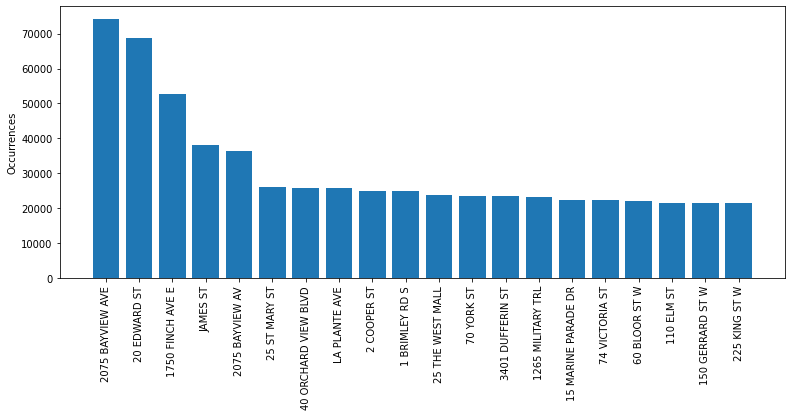

In [5]:
# from the location counts we pick top 20 datasets.
top_20_counts =  location2_counts[:20].to_frame().reset_index()
top_20_counts.columns = ["address","count"]

# plot the top 20 locations based on counts
plt.figure(figsize=(13,5))
plt.bar(top_20_counts["address"],top_20_counts["count"])
plt.xticks(rotation="vertical")
plt.ylabel("Occurrences")
plt.show()

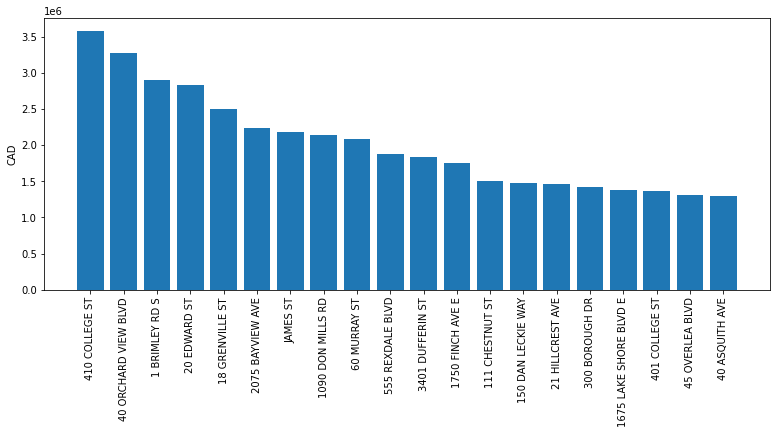

In [6]:
# group by infraction_description and get sum of fines in each infraction
# then we can pick the top 20 locations for infraction based on net fines
top_20_fines = all_tickets[["location2","set_fine_amount"]]\
                    .groupby("location2")\
                    .sum()\
                    .sort_values(by=["set_fine_amount"], ascending=False)[0:20]\
                    .reset_index()
top_20_fines.columns = ["address","total_fine"]

# plot the top 20 locations based on fines
plt.figure(figsize=(13,5))
plt.bar(top_20_fines["address"],top_20_fines["total_fine"])
plt.xticks(rotation="vertical")
plt.ylabel("CAD")
plt.show()

# Get coordinates
Now that we have identified the hotsopt addresses, we need to figure out the coordinates for each address so that we can calculate distances. For this purpose we will use geopy (https://geopy.readthedocs.io/en/stable/) a python geocoding API. In our case we will make use of Nominatim which is powered by OpenStreetMaps.

In [7]:
# function to get lat and long for an address
def getLatLong(address, attempt=1, max_retries=10):
    try:
        geolocator = Nominatim(user_agent="NK_Tor_tickets")
        location = geolocator.geocode(f"{address}, Toronto, Canada")
    except Exception:
        if (attempt<=max_retries):
            return getLatLong(address, attempt+1)
        else:
            print("Retries exceeded!")
            return "NA"
    return f"{location.latitude},{location.longitude}"

# function to add latitude and longitude columns to a dataset based on an address column
def latLongFromAddress(df, column_name="address", lat_name="latitude", lon_name="longitude"):
    tdf = df[[column_name]].copy()
    geocoded = list(tdf[column_name])
    locations = [getLatLong(address) for address in geocoded]
    tdf[lat_name] = [float(x.split(',')[0]) for x in locations]
    tdf[lon_name] = [float(x.split(',')[1]) for x in locations]
    return tdf

Using the functitons that we just created, we can add latitude and longitude columns for our two datasets that are top 20 infraction sites based on counts and fines respectively.

In [8]:
# get coordinate columns
top_20_counts_latlng = latLongFromAddress(top_20_counts)
top_20_fines_latlng = latLongFromAddress(top_20_fines)

With these coordinates, we can create GeoDataFrames which handles geographic datasets really well and is built on top of pandas.

In [9]:
# convert the dataframe to geodataframe and specify the crs as EPSG:4326
top_20_counts_gdf = gpd.GeoDataFrame(
    top_20_counts_latlng,
    geometry=gpd.points_from_xy(
        top_20_counts_latlng.longitude, 
        top_20_counts_latlng.latitude
    )
)
top_20_counts_gdf.crs = "EPSG:4326"

# do the same for top 20 sites by fine
top_20_fines_gdf = gpd.GeoDataFrame(
    top_20_fines_latlng,
    geometry=gpd.points_from_xy(
        top_20_fines_latlng.longitude, 
        top_20_fines_latlng.latitude
    )
)
top_20_fines_gdf.crs = "EPSG:4326"

# Proximity to Green P Parking spots
The coordinates for our hotspots enables us to perform proximity analysis with parking spots throughout the city. Here we will be mapping the hotspots along with the parking spots as well as finding out ho far is the closest parking spot to these hotspots.

In [10]:
# read the 2019 json file for green p parking
with open(f"{folders['green-p-parking']}/green-p-parking-2019.json") as data:
    parsed_parking_2019_json = json.load(data)
parking_2019 = pd.json_normalize(parsed_parking_2019_json["carparks"])
parking_2019.head()

,id,slug,address,lat,lng,rate,carpark_type,carpark_type_str,is_ttc,is_under_construction,...,map_marker_logo,alert_box,enable_streetview,streetview_lat,streetview_long,streetview_yaw,streetview_pitch,streetview_zoom,rate_details.periods,rate_details.addenda
0,1,https://parking.greenp.com/carpark/1_20-charle...,20 Charles Street East,43.669282202140174,-79.3852894625656,$2.50 / Half Hour,garage,Garage,False,False,...,greenp_only,Monthly Permits are no longer available at thi...,yes,43.669282202140174,-79.3852894625656,321.21,-12.45,0,"[{'title': 'Monday - Sunday & Holidays', 'rate...",[]
1,3,https://parking.greenp.com/carpark/3_13-isabel...,13 Isabella Street,43.667577,-79.384707,$3.00 / Half Hour,surface,Surface,False,False,...,greenp_only,,yes,43.667735,-79.384966,115.84,7.51,0,"[{'title': 'Monday - Sunday & Holidays', 'rate...",[]
2,5,https://parking.greenp.com/carpark/5_15-welles...,15 Wellesley Street East,43.664837,-79.383591,$3.00 / Half Hour,surface,Surface,False,False,...,greenp_bikeshare,,yes,43.665083,-79.383807,138.09,-4.68,0,"[{'title': 'Monday - Sunday & Holidays', 'rate...",[]
3,11,https://parking.greenp.com/carpark/11_21-pleas...,21 Pleasant Blvd.,43.687092,-79.392850,$3.00 / Half Hour,garage,Garage,False,False,...,greenp_only,,yes,43.686491,-79.392056,280.08,-13.18,0,"[{'title': 'Monday - Sunday & Holidays', 'rate...",[]
4,12,https://parking.greenp.com/carpark/12_30-alvin...,30 Alvin Avenue,43.68919056469554,-79.39269983525526,$3.50 / Half Hour,surface,Surface,False,False,...,greenp_only,,yes,43.68919056469554,-79.39269983525526,330.84,1.32,0,[{'title': 'Day Maximum until 6 PM - $25.00 (E...,[]


In [11]:
# convert the read data to geodataframe
parking_2019_gdf = gpd.GeoDataFrame(
    parking_2019,
    geometry=gpd.points_from_xy(
        parking_2019.lng, 
        parking_2019.lat
    )
)
parking_2019_gdf.crs = "EPSG:4326"

Let's create a function that will help us visualize layers on map since we will be using it multiple times in this nottebook.

In [12]:
# function to show layers on an interactive map
def show_in_map(gdfs, names, colors, types, no_more_layers=True):
    x1,y1,x2,y2 = gdfs[0]['geometry'].total_bounds
    m = folium.Map(tiles='openstreetmap')
    LocateControl().add_to(m)
    m.fit_bounds([[y1, x1], [y2, x2]])
    
    for i, gdf in enumerate(gdfs):
        if (types[i] == "Point"):
            folium.GeoJson(gdf,
                           name=names[i],
                           marker = folium.CircleMarker(
                               radius = 5, 
                               weight = 0, 
                               fill_color = colors[i], 
                               fill_opacity = 1),
                          ).add_to(m)
        elif (types[i] == "Polygon"):
            folium.GeoJson(gdf,
                           name=names[i],
                           style_function= lambda f : {
                               "fillColor": colors[i],
                               "color":colors[i],
                               "weight":1,
                               "fillOpacity":0.2
                           }
                          ).add_to(m)
    if no_more_layers:
        folium.LayerControl().add_to(m)
    return m

In [13]:
# show parking spotts, hotspots by frequency and hotspots by fines on a map
show_in_map([parking_2019_gdf, top_20_counts_gdf, top_20_fines_gdf],
            ["Green P Parking","Top 20 occurrence", "Top 20 fines"],
            ["green", "black", "blue"],
            ["Point", "Point", "Point"])

Looking at the map, we can see that most of the infractions are concentrated in the southern partt of the city.

Now to calculate distance from each hostpot to it's closest parking spot.

In [14]:
# do a unary union on the parking dataset
parking_2019_uu = parking_2019_gdf.geometry.unary_union
# function to find the nearest parking spot to a given point
def nearest_parking(point):
    nearest = parking_2019_gdf.geometry == nearest_points(point, parking_2019_uu)[1]
    return parking_2019_gdf[nearest].id.values[0]

In [15]:
# create a copy object to keep the base dataframe clean
top_20_counts_pid = top_20_counts_gdf.copy()
# get nearest parking for geometry in each row
top_20_counts_pid["id"] = top_20_counts_gdf.apply(lambda loc : nearest_parking(loc.geometry), axis=1)
# get other information based on the id of nearest parking spot
top_20_counts_parking = pd.merge(top_20_counts_pid, parking_2019,left_on="id",right_on="id",how="left")

# create a copy object to keep the base dataframe clean
top_20_fines_pid = top_20_fines_gdf.copy()
# get nearest parking for geometry in each row
top_20_fines_pid["id"] = top_20_fines_gdf.apply(lambda loc : nearest_parking(loc.geometry), axis=1)
# get other information based on the id of nearest parking spot
top_20_fines_parking = pd.merge(top_20_fines_pid, parking_2019,left_on="id",right_on="id",how="left")

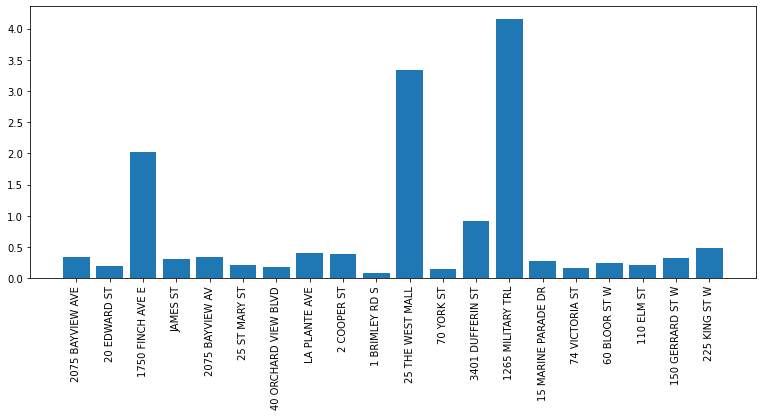

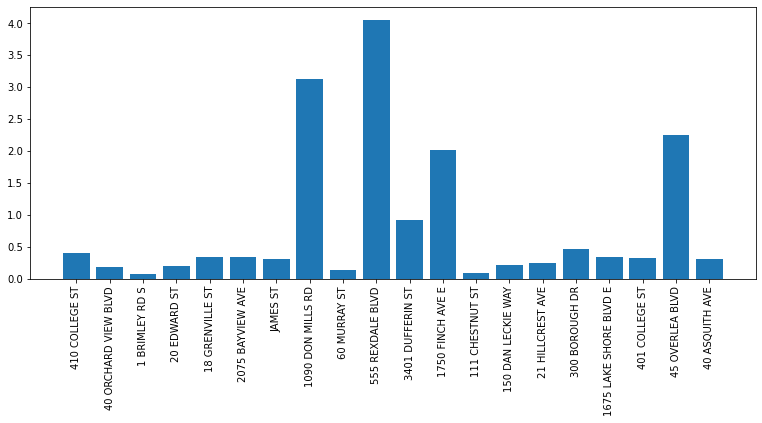

In [16]:
# get distances based on the coordinates of the hotspot and coordinates of the joined 
# nearest parking spot
top_20_counts_address = top_20_counts_parking[["address_x", "address_y"]].copy()
top_20_counts_address["distance"] = top_20_counts_parking[["latitude", "longitude", "lat", "lng"]]\
                    .apply(lambda x: geodesic((x.latitude, x.longitude),
                                              (x.lat, x.lng)).km, 
                           axis=1)

top_20_fines_address = top_20_fines_parking[["address_x", "address_y"]].copy()
top_20_fines_address["distance"] = top_20_fines_parking[["latitude", "longitude", "lat", "lng"]]\
                    .apply(lambda x: geodesic((x.latitude, x.longitude),
                                              (x.lat, x.lng)).km, 
                           axis=1)

# show the distances on plots
plt.figure(figsize=(13,5))
plt.bar(top_20_counts_address["address_x"],top_20_counts_address["distance"])
plt.xticks(rotation="vertical")
plt.show()

plt.figure(figsize=(13,5))
plt.bar(top_20_fines_address["address_x"],top_20_fines_address["distance"])
plt.xticks(rotation="vertical")
plt.show()

These charts paints a serious picture. While from last notebook we know that most frequent infractions are parking infractions, this chart shows that most common spots where infractions occur are close to a parking spot. This means that the issue is not with availability of places to park but rather drivers not being able to discern whether they are able to park where they did or not. This could also be due to drivers not tracking the day/time for parking regulations correctly.

# Proximity to TTC stops
Similar to parking spots, the coordinates for our hotspots enables us to perform proximity analysis with ttc bus stop throughout the city. Here we will be mapping the hotspots along with the parking spots as well as finding out ho far is the closest bus stop to these hotspots.

In [17]:
# read the ttc stops data into a geodataframe and set proper crs
ttc_stops = pd.read_csv(f"{folders['ttc']}/stops.txt")
ttc_stops_gdf = gpd.GeoDataFrame(
    ttc_stops,
    geometry=gpd.points_from_xy(
        ttc_stops.stop_lon,
        ttc_stops.stop_lat
    )
)
ttc_stops_gdf.crs = "EPSG:4326"

In [18]:
# see the bus stops and hotspots in map
show_in_map([ttc_stops_gdf, top_20_counts_gdf, top_20_fines_gdf],
            ["TTC stops","Top 20 occurrence", "Top 20 fines"],
            ["red", "black", "blue"],
            ["Point", "Point", "Point"])

In [19]:
# create a unary union of bus stops
ttc_stops_uu = ttc_stops_gdf.geometry.unary_union
# function to get the nearest bus stop to a point
def nearest_stop(point):
    nearest = ttc_stops_gdf.geometry == nearest_points(point, ttc_stops_uu)[1]
    return ttc_stops_gdf[nearest].stop_id.values[0]

In [20]:
# create a copy object to keep the base dataframe clean
top_20_counts_sid = top_20_counts_gdf.copy()
# get nearest stop for geometry in each row
top_20_counts_sid["stop_id"] = top_20_counts_gdf.apply(lambda loc : nearest_stop(loc.geometry), axis=1)
# get other information based on the id of nearest stop
top_20_counts_stop = pd.merge(top_20_counts_sid, ttc_stops,left_on="stop_id",right_on="stop_id",how="left")

# create a copy object to keep the base dataframe clean
top_20_fines_sid = top_20_fines_gdf.copy()
# get nearest stop for geometry in each row
top_20_fines_sid["stop_id"] = top_20_fines_gdf.apply(lambda loc : nearest_stop(loc.geometry), axis=1)
# get other information based on the id of nearest stop
top_20_fines_stop = pd.merge(top_20_fines_sid, ttc_stops,left_on="stop_id",right_on="stop_id",how="left")

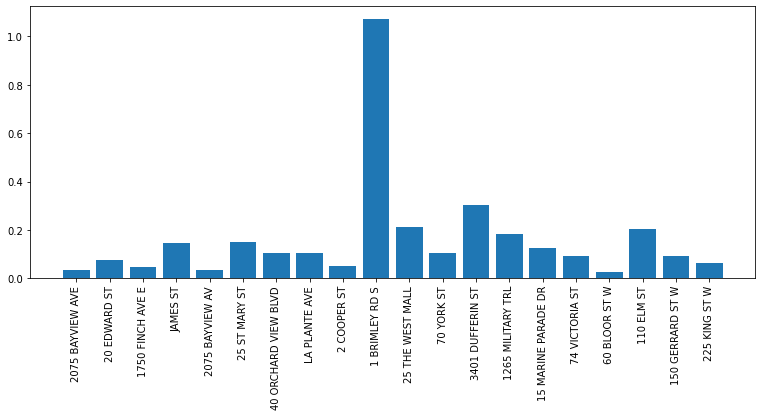

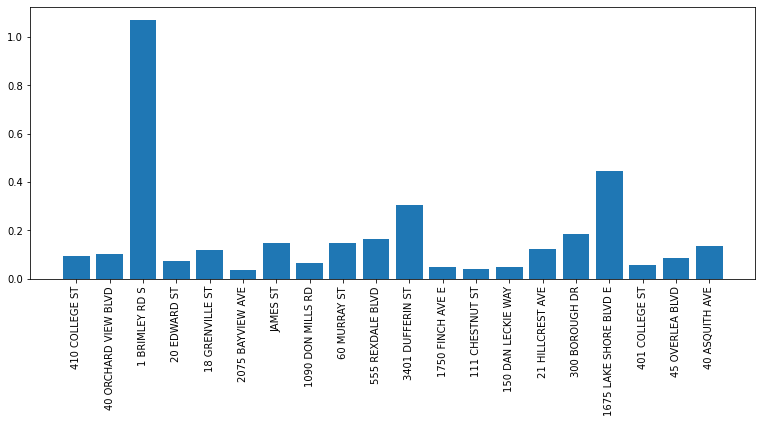

In [21]:
# get distances based on the coordinates of the hotspot and coordinates of the joined 
# nearest stop
top_20_counts_address = top_20_counts_stop[["address", "stop_name"]].copy()
top_20_counts_address["distance"] = top_20_counts_stop[["latitude", "longitude", "stop_lat", "stop_lon"]]\
                    .apply(lambda x: geodesic((x.latitude, x.longitude),
                                              (x.stop_lat, x.stop_lon)).km, 
                           axis=1)

top_20_fines_address = top_20_fines_stop[["address", "stop_name"]].copy()
top_20_fines_address["distance"] = top_20_fines_stop[["latitude", "longitude", "stop_lat", "stop_lon"]]\
                    .apply(lambda x: geodesic((x.latitude, x.longitude),
                                              (x.stop_lat, x.stop_lon)).km, 
                           axis=1)

# show the distances on plots
plt.figure(figsize=(13,5))
plt.bar(top_20_counts_address["address"],top_20_counts_address["distance"])
plt.xticks(rotation="vertical")
plt.show()

plt.figure(figsize=(13,5))
plt.bar(top_20_fines_address["address"],top_20_fines_address["distance"])
plt.xticks(rotation="vertical")
plt.show()

Once again, these charts reinforce the idea presented earlier. In most of the top 20 places, a bus stop is really close so the drivers do have an option of parking in a spot that does not cause an infraction and then take the ttc. The issue does not seem to be availability of services.

# Study distribution by wards
While most of these top 20 addresses seem to be located in southern part of the city, let's look at which wards house most of these spots. 

In [22]:
# reading the wards geojson file
wards_gdf = gpd.read_file(wards_gjson)
wards_gdf.crs = "EPSG:4326"
wards_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 25 entries, 0 to 24
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   _id                25 non-null     int64   
 1   AREA_ID            25 non-null     int64   
 2   DATE_EFFECTIVE     25 non-null     object  
 3   DATE_EXPIRY        25 non-null     object  
 4   AREA_ATTR_ID       25 non-null     int64   
 5   AREA_TYPE_ID       25 non-null     int64   
 6   PARENT_AREA_ID     0 non-null      object  
 7   AREA_TYPE          25 non-null     object  
 8   AREA_CLASS_ID      0 non-null      object  
 9   AREA_CLASS         0 non-null      object  
 10  AREA_SHORT_CODE    25 non-null     int64   
 11  AREA_LONG_CODE     25 non-null     int64   
 12  AREA_NAME          25 non-null     object  
 13  AREA_DESC          25 non-null     object  
 14  FEATURE_CODE       0 non-null      object  
 15  FEATURE_CODE_DESC  0 non-null      object  
 16  TR

In [23]:
# spatially join wards with the top 20 spots
tc_wards = gpd.sjoin(wards_gdf, top_20_counts_gdf, how="left")
tc_wards = tc_wards[["_id","address"]]\
                    .groupby("_id")\
                    .count()\
                    .reset_index()
tc_wards.columns = ["_id","num"]

tf_wards = gpd.sjoin(wards_gdf, top_20_fines_gdf, how="left")
tf_wards = tf_wards[["_id","address"]]\
                    .groupby("_id")\
                    .count()\
                    .reset_index()
tf_wards.columns = ["_id","num"]

In [24]:
# add the hotspots and wards to the map
m = show_in_map([wards_gdf],["Wards"],["green"],["Polygon"],False)
folium.GeoJson(top_20_counts_gdf,
               name="Top infractions by frequency",
               marker = folium.CircleMarker(
                   radius = 5, 
                   weight = 0, 
                   fill_color = "black", 
                   fill_opacity = 0.5),
              ).add_to(m)
folium.GeoJson(top_20_fines_gdf,
               name="Top infractions by fines",
               marker = folium.CircleMarker(
                   radius = 5, 
                   weight = 0, 
                   fill_color = "blue", 
                   fill_opacity = 0.5),
              ).add_to(m)
folium.LayerControl().add_to(m)
m

We want to see which ward has highest concentration of these high infraction spots. This type of data is best visualized as a choropleth map.

In [25]:
# helper function to create and show choropleth map
def show_choropleth(polygons,data,joinon="_id",data_col="num",tooltip_col="AREA_NAME"):
    x1,y1,x2,y2 = polygons['geometry'].total_bounds
    m = folium.Map(tiles='openstreetmap')
    m.fit_bounds([[y1, x1], [y2, x2]])

    m_wards = folium.Choropleth(
        geo_data=polygons,
        name="choropleth",
        data=data,
        columns=[joinon,data_col],
        key_on="feature.properties."+joinon,
        fill_color="OrRd",
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name="",
    ).add_to(m)

    m_wards.geojson.add_child(
        folium.features.GeoJsonTooltip(["AREA_NAME"])
    )
    return m


In [26]:
# show a choropleth map of wards containing top 20 addresses by number of infractions
show_choropleth(wards_gdf, tc_wards)

Here, we can see that the University-Rosedale ward houses the highest number of top 20 addresses with Spadina-Fort York behind it.

In [27]:
# show a choropleth map of wards containing top 20 addresses by net fines
show_choropleth(wards_gdf, tf_wards)

Similar to above, University-Rosedale ward houses the highest number of addresses on tickes that have generated top 20 revenue between 2008 and 2020 with Spadina-Fort York behind it. While Etobicoke-Lakeshore and Scarborough-Rouge Park have spots that are top 20 for number of infractions, it does not have a spot that is top 20 in fine amounts. This means that most infractions there are minor with smaller fines. On the other hand, it opposite is true for Etobicoke North, Willowdale, Don Calley East and Scarborough Centre.

# A way forward

There are lots of interesting data in the dataset and given enough time, it would be great to explore more. There are a few questions that are especially woth looking into. How many tickets have been issued by each ward so far? What is the trend and change by year in these tickets by year? Are there areas where violations specifically occur at specific times? Are there some specific types of infractions that needs to be focused on?
A better geocoding service could also be explored to be used since the one used here is free but intended to sparse use which results in frequent timeouts.